In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.optimize import curve_fit

In [2]:
# Make the plots a bit bigger to see
# NOTE: Must be done in a separate cell
plt.rcParams['figure.dpi'] = 100

In [3]:
# path1 = "../NoneqTrans2/Data_test/80x80/vrun2_d1_40/"
path1 = "../NoneqTrans2/Data_test/par_set1/vrun1_d2_85/"
# path1 = "../../../../../../Volumes/Kunal_EHD/Work/Codes/RS_data_122920/par_set1_cbc/vrun1_d1_90/"
# Python Data Single run
A1 = np.loadtxt(path1 + "delta_f2py_test.dat")
nn = np.size(A1,0)
print(np.shape(A1))

#### Python Data Voltage Up
E_up = A1[:,0]
# T_up = A1[:,0]
delta_up = A1[:,1]
I_up = A1[:,6]
Vs_up = A1[:,4]
R_up = A1[:,7]
# dR_up = A1[:,9]
mx = 64
my = 64

inputs = open(path1+"input_par.dat", "r")
Nsamp = 512
maxdist = mx//2

V_crit = 672.0 #691.2
V_metal = 998.4 #992.0

# V_crit = 537.6
# V_metal = 697.6

# V_crit = 844.8
print(inputs.read())

(200, 11)
{'mx': 64, 'my': 64, 'nwarm': 400000, 'nskip': 16, 'Tc': 1.0, 'coef': 0.1, 'dphi': 0.2, 'gamma': 0.1, 'r0': 3.5, 'g2': 1.0, 'g4': -1.0, 'g6': 0.5, 'Rload': 1.0, 'mfphi': False, 'tloop': False}{'Tcrit': 1.32, 'dE': 0.1, 'minE': 0.1, 'maxE': 20.1, 'dTb': 0.01, 'minT': 0.01, 'maxT': 2.01, 'nmeas': 2048, 'Tbath': 0.85, 'seed': 2384824, 'NPEs': 1, 'iphi': True}


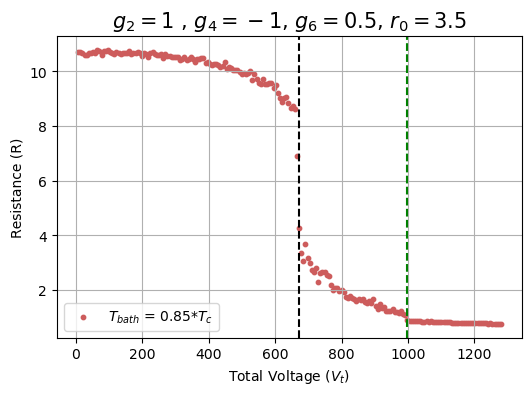

In [4]:
plt.scatter(E_up*my,R_up, s=10.0,c="IndianRed",label="$T_{bath}$ = 0.85*$T_c$")
plt.ylabel('Resistance (R)')
plt.xlabel('Total Voltage ($V_t$)')

# plt.scatter(E_up,delta_up, s=10.0,c="IndianRed", label = r'$\langle \Delta \rangle$')
# plt.ylabel( 'Average $\Delta$')
# plt.xlabel('Bath Temperature (T)')

# plt.xlim(18.,30.)
plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
plt.title('$g_2 = 1$ , $g_4 = -1$, $g_6 = 0.5$, $r_0 = 3.5$' , fontsize = 15)
plt.grid(b=True,which='major', axis='both')
plt.legend()

# plt.savefig(path1 + "Resitance_v_Field.pdf")
plt.show()

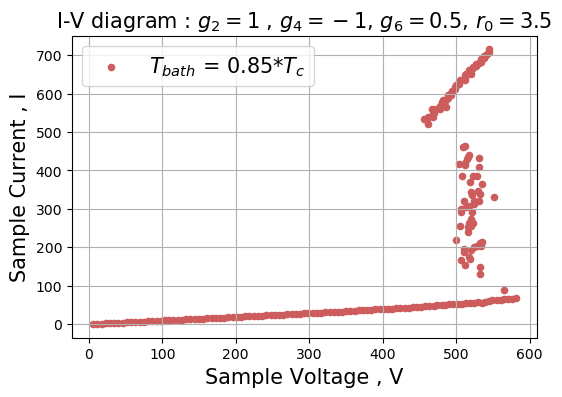

In [5]:
plt.scatter(Vs_up, I_up, s = 20.0, c = 'IndianRed', label='$T_{bath}$ = 0.85*$T_c$' , marker = 'o')
# plt.plot(Vs_up, I_up,  c = 'IndianRed')


# plt.plot(Data_Set[:,0],Data_Set[:,1])
plt.legend(fontsize = 15)
plt.title('I-V diagram : $g_2 = 1$ , $g_4 = -1$, $g_6 = 0.5$, $r_0 = 3.5$' , fontsize = 15)
# plt.title('I-V diagram , $n_{skip}$=32, $E$ = 0.1')
plt.xlabel('Sample Voltage , V', fontsize = 15 )
plt.ylabel('Sample Current , I', fontsize = 15 )
# plt.xlim(14.0,22.)
plt.grid(b=True,which='major', axis='both')
# plt.savefig(path1 + "I-V.pdf")

plt.show()

In [6]:
G_x = np.loadtxt(path1 + "gofr_x2.dat")
G_y = np.loadtxt(path1 + "gofr_y2.dat")

print(np.shape(G_x), np.shape(G_y))
# maxdist = np.shape(G_x)[1]
# print(maxdist)


(200, 32) (200, 32)


In [7]:
x_ax = np.arange(0,maxdist)

# for k in range(nn):
#     plt.plot(x_ax,G_x[k,:], label = " Perpendicular to the field")
#     plt.plot(x_ax,G_y[k,:], label = " Parallel to field")
    
#     plt.ylabel("g(r)")
#     plt.xlabel("r")
#     plt.title("E = "+ format(E_up[k]*my,'.2f'))
#     plt.grid(b=True,which='major', axis='both')
#     plt.legend()
#     plt.show()



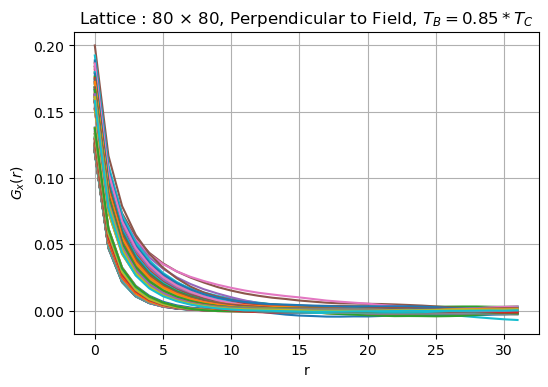

In [8]:
for k in range(0,nn):
    if E_up[k]*my == V_crit:
        plt.plot(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(mx), '.2f'), linestyle = 'dashed' )
    else :
        plt.plot(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(mx), '.2f'))
#     plt.scatter(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(mx), '.2f') )

plt.title(r'Lattice : 80 $\times$ 80, Perpendicular to Field, $T_B = 0.85*T_C$')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_x(r)$')
plt.xlabel('r')

# plt.savefig(path1 + "gofrx2_85%.pdf",bbox_inches='tight')
plt.show()    



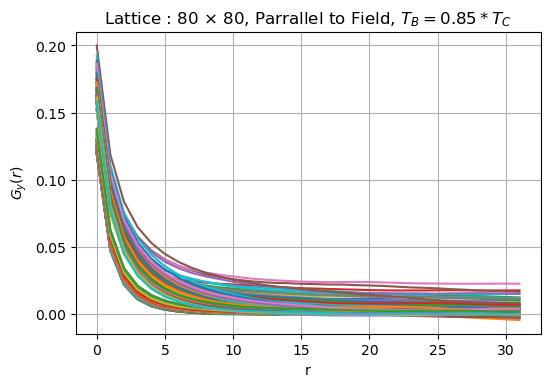

In [9]:
for k in range(0,nn):
    if E_up[k]*my == V_crit:
        plt.plot(x_ax,G_y[k,:],label = "E = " + format(E_up[k]*(mx), '.2f'), linestyle = 'dashed' )
    else :
        plt.plot(x_ax,G_y[k,:],label = "E = " + format(E_up[k]*(mx), '.2f'))


plt.title(r'Lattice : 80 $\times$ 80, Parrallel to Field, $T_B = 0.85*T_C$')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_y(r)$')
plt.xlabel('r')  
# plt.savefig(path1 + "gofry2_85%.pdf",bbox_inches='tight')
plt.show()    

Text(0.5, 0, 'r')

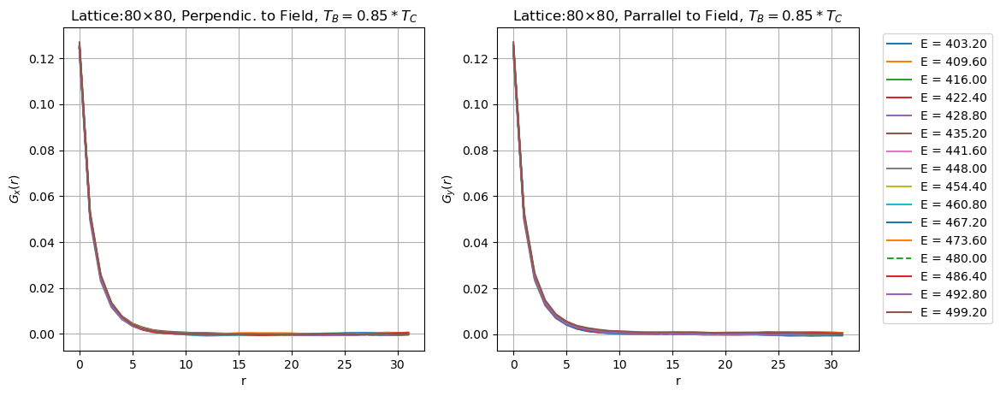

In [10]:
upper = 500.
lower = 400.

f = plt.figure(figsize=(12, 5)); # plot the calculated values    
# plt.title("Average Correlation plots")

sp =  f.add_subplot(1, 2, 1 );
for k in range(0,nn):
    if E_up[k]*my == 480:
        plt.plot(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(my), '.2f'), linestyle = 'dashed' )
    elif E_up[k]*my > lower and E_up[k]*my < upper :
#         if k%4 == 0:
        plt.plot(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(my), '.2f') )
    else:
        None

plt.title(r'Lattice:80$\times$80, Perpendic. to Field, $T_B = 0.85*T_C$')

# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_x(r)$')
plt.xlabel('r')
   
# plt.show()    


sp =  f.add_subplot(1, 2, 2 );
for k in range(0,nn):
    if E_up[k]*my == 480:
        plt.plot(x_ax,G_y[k,:],label = "E = " + format(E_up[k]*(my), '.2f'), linestyle = 'dashed' )
    elif E_up[k]*my > lower and E_up[k]*my < upper :
#         if k%4 == 0:
        plt.plot(x_ax,G_y[k,:],label = "E = " + format(E_up[k]*(my), '.2f') )
    else:
        None


plt.title(r'Lattice:80$\times$80, Parrallel to Field, $T_B = 0.85*T_C$')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_y(r)$')
plt.xlabel('r')  
# plt.show()


# plt.savefig(path1 + "gofr_85%_i.pdf",bbox_inches='tight')

In [11]:
hwhm_x = np.zeros(nn)
hwhm_y = np.zeros(nn)
for k in range(nn):
    half_max = np.max(G_x[k,:])/2.
    for r in range(maxdist-1):
        if G_x[k,r] > half_max and G_x[k,r+1] <= half_max:
#             print(x_ax[r+1])
            hwhm_x[k] = x_ax[r+1]

for k in range(nn):
    half_max = np.max(G_y[k,:])/2.
    for r in range(maxdist-1):
        if G_y[k,r] > half_max and G_y[k,r+1] <= half_max:
#             print(x_ax[r+1])
            hwhm_y[k] = x_ax[r+1]


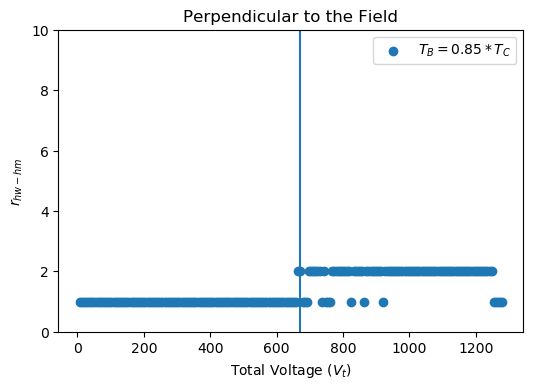

In [12]:
plt.scatter(E_up*my,hwhm_x,label = r'$T_B = 0.85*T_C$')
# plt.plot(E_up*my,hwhm_x,label = r'$T_B = 0.85*T_C$')
plt.ylim(0,10)
plt.xlabel("Total Voltage ($V_t$)")
plt.ylabel(r'$r_{hw-hm}$')
plt.title("Perpendicular to the Field")
plt.axvline(x=V_crit)
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend()
# plt.savefig(path1 + "HWHM_X.pdf",bbox_inches='tight')
plt.show()

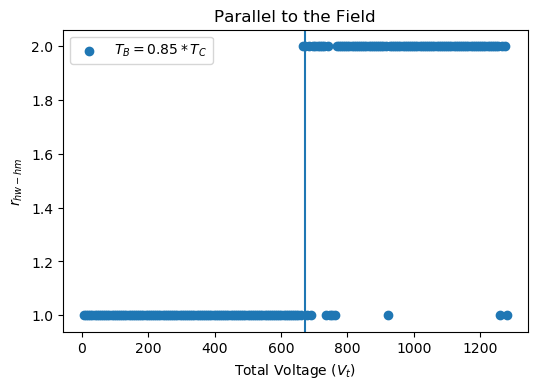

In [13]:
plt.scatter(E_up*my,hwhm_y,label = r'$T_B = 0.85*T_C$')
# plt.plot(E_up*my,hwhm_y,label = r'$T_B = 0.85*T_C$')
# plt.ylim(-1,10)
plt.xlabel("Total Voltage ($V_t$)")
plt.ylabel(r'$r_{hw-hm}$')
plt.title("Parallel to the Field")
plt.axvline(x=V_crit)
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend()
# plt.savefig(path1 + "HWHM_Y.pdf",bbox_inches='tight')
plt.show()

## Fit for $g(r)$

In [14]:
Gx = np.loadtxt(path1 + "gofr_x_full2.dat")
Gy = np.loadtxt(path1 + "gofr_y_full2.dat")

print(np.shape(Gx), np.shape(Gy))

datpts = np.shape(Gx)[1]

print(datpts, Nsamp, maxdist)
x_ax = np.arange(0.01,maxdist+0.01)
x_ax2 = np.linspace(0.01,32.01,datpts)
x_val = np.tile(x_ax,(Nsamp,1))
x_ax1 = x_val.flatten('F')
# print('x_val :', x_val)

# print(x_ax1)
# print(x_ax2)
# print(np.shape(x_val))
# print(np.shape(x_ax1))
# print(np.shape(x_ax2))



(200, 16384) (200, 16384)
16384 512 32


In [15]:
def fit_fn(r,theta,lmbda,A, y0):
    return A*(r**(-theta))*np.exp(-lmbda*r) + y0 

def fit_fn1(r,theta,xi,A, y0):
    return A*(r**(-theta))*np.exp(-(r/xi)) + y0 

# def fit_fn2(r,theta,A,y0,B):
#     return A*r**(-theta) + B*(1. - r)


# plt.plot(x_ax2, fit_fn(x_ax2,0.1,0.1,0.3,0.2))
# plt.plot(x_ax2, fit_fn1(x_ax2,0.1,10,0.3,0.2))
# # plt.ylim(0,0.4)
# plt.show()


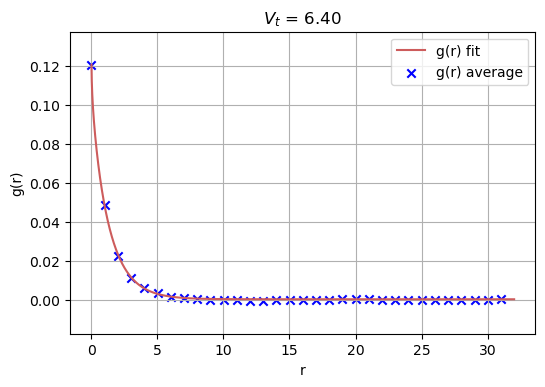

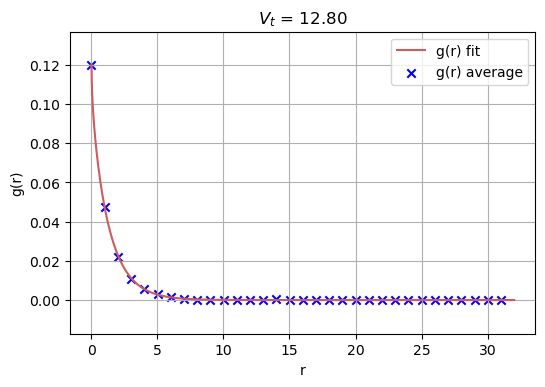

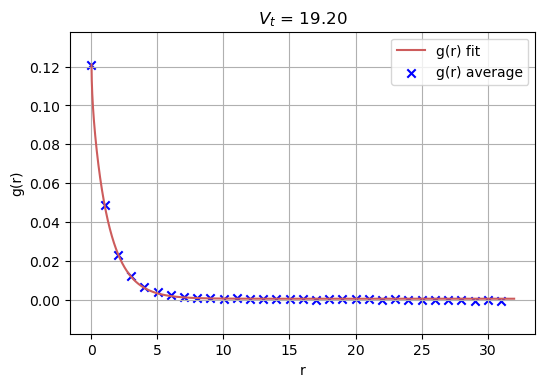

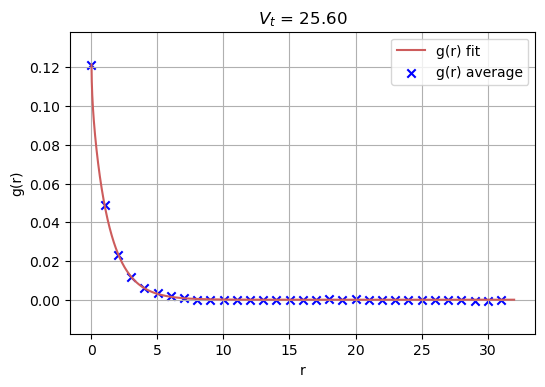

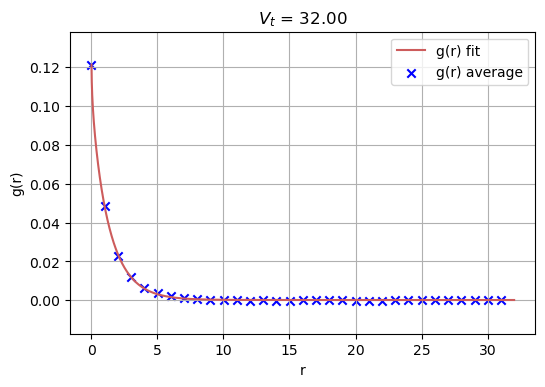

...

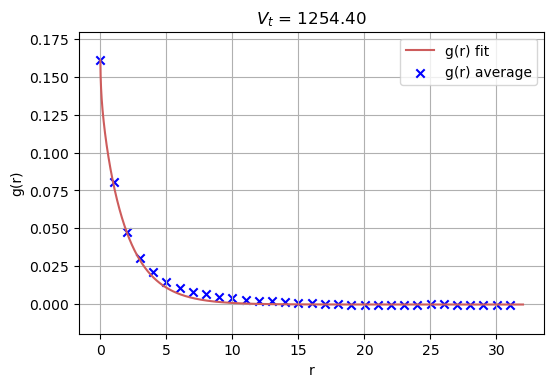

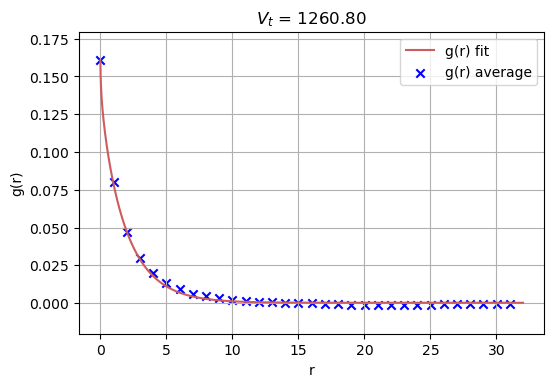

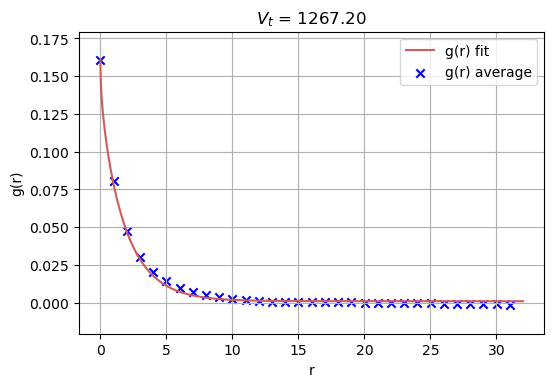

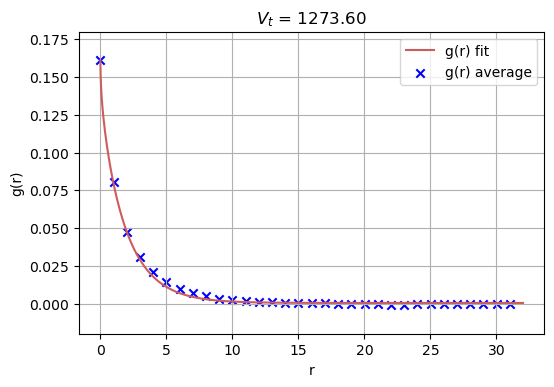

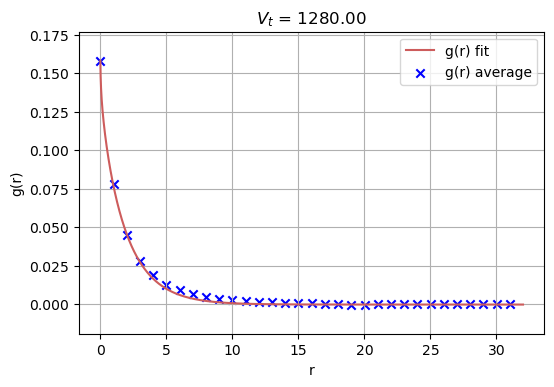

In [16]:
######### X 0 
p0 = [0.2,6.,0.5,0.05]
    
thetax = []
xi_x = []

Gx_fit = np.zeros((nn,datpts))

for k in range(nn):
#     if E_up[k]*my <= V_crit or E_up[k]*my >= V_metal:
    p1, pc1 = curve_fit(fit_fn1, x_ax, G_x[k,:], p0)
    per1 = np.sqrt(np.diag(pc1))
#     r = G_x[k,:] - fit_fn(x_ax,*p1)
#     chi2 = np.sum((r)**2)/(nn-2)
#     print(*p1)
    thetax.append(p1[0])
    xi_x.append(p1[1])
    Gx_fit[k,:] = fit_fn1(x_ax2,*p1)
    plt.scatter(x_ax,G_y[k,:], label = 'g(r) average', color = 'Blue', marker = 'x')
    plt.plot(x_ax2,fit_fn1(x_ax2,*p1), label = "g(r) fit", color = 'IndianRed')
#     plt.scatter(x_ax1, Gx[k,:], s=2, label = "g(r)")
    plt.ylabel("g(r)")
    plt.xlabel("r")
    plt.title("$V_t$ = "+ format(E_up[k]*my,'.2f'))
    plt.grid(b=True,which='major', axis='both')
    plt.legend()
    plt.show()
#     else:
#         p0 = [0.5,0.5,0.5,0.5]
#         p1, pc1 = curve_fit(fit_fn2, x_ax1, Gx[k,:])
#         per1 = np.sqrt(np.diag(pc1))
# #     r = G_x[k,:] - fit_fn(x_ax,*p1)
# #     chi2 = np.sum((r)**2)/(nn-2)
# #     print(*p1)
#         thetax.append(p1[0])
#         zetax.append(0.0)
#         Gx_fit[k,:] = fit_fn2(x_ax2,*p1)
#         plt.plot(x_ax2,fit_fn2(x_ax2,*p1), label = "g(r) fit")
#         plt.scatter(x_ax1, Gx[k,:], s=2, label = "g(r)")
#         plt.ylabel("g(r)")
#         plt.xlabel("r")
#         plt.title("$V_t$ = "+ format(E_up[k]*my,'.2f'))
#         plt.grid(b=True,which='major', axis='both')
#         plt.legend()
#         plt.show()

        



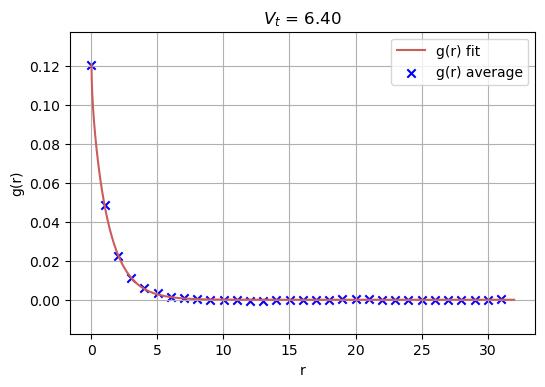

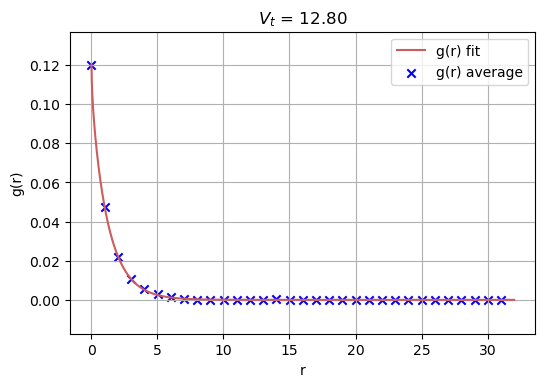

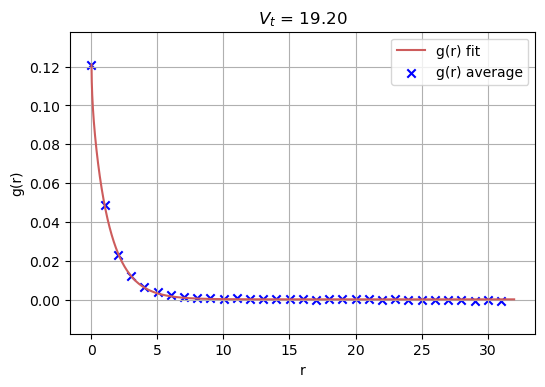

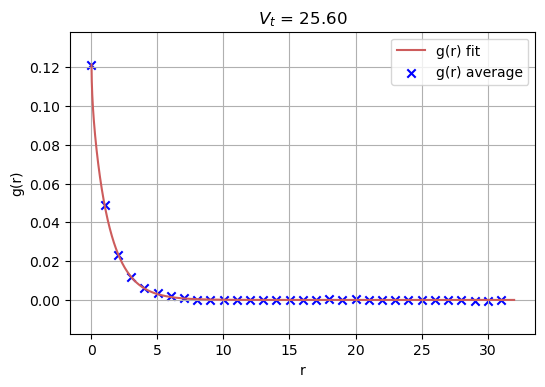

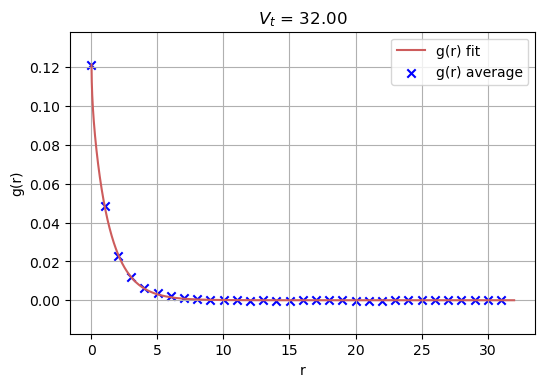

...

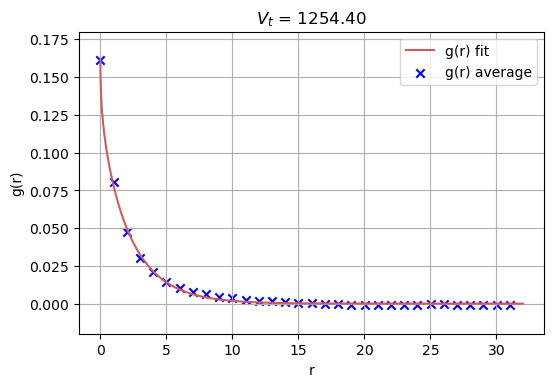

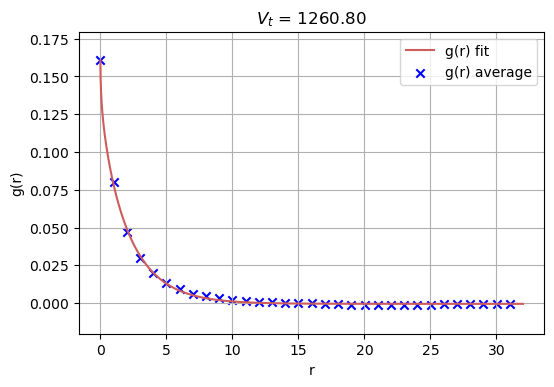

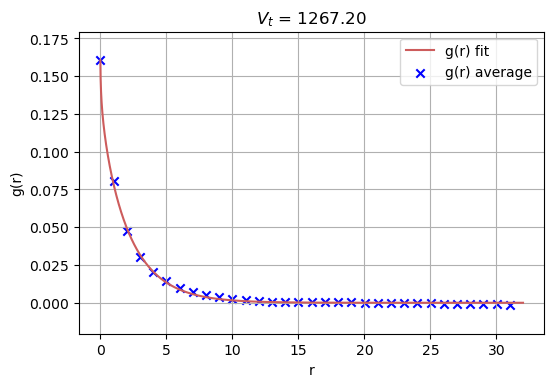

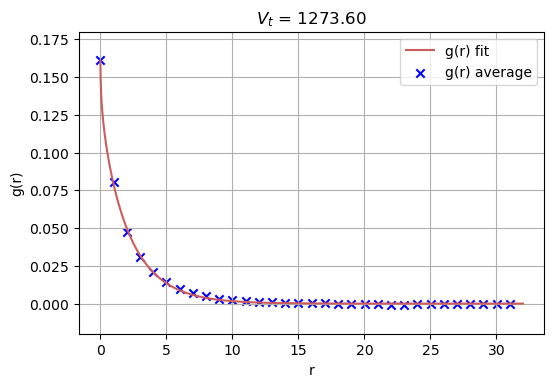

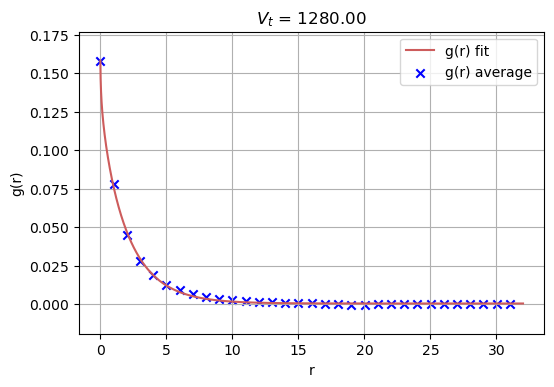

In [17]:
########## Y -axis ##############
thetay = []
xi_y = []
yinf = []
p0 = [0.2,2.,0.5,0.05]
Gy_fit = np.zeros((nn,datpts))
# Gy_fit = np.zeros((nn,maxdist))
for k in range(nn):
#     if E_up[k]*my < V_crit:
    p1, pc1 = curve_fit(fit_fn1, x_ax, G_y[k,:], p0)
    per1 = np.sqrt(np.diag(pc1))
#     else : 
#         p1, pc1 = curve_fit(fit_fn, x_ax1, Gy[k,:], p0)
#         per1 = np.sqrt(np.diag(pc1))
        
#     r = G_x[k,:] - fit_fn(x_ax,*p1)
#     chi2 = np.sum((r)**2)/(nn-2)
#     print(*p1)
    Gy_fit[k,:] = fit_fn1(x_ax2,*p1)
    thetay.append(p1[0])
    xi_y.append(p1[1])
    yinf.append(p1[3])
    plt.scatter(x_ax,G_y[k,:], label = 'g(r) average', color = 'Blue', marker = 'x')
    plt.plot(x_ax2,fit_fn1(x_ax2,*p1), label = "g(r) fit", color = 'IndianRed')
#     plt.scatter(x_ax1, Gy[k,:], s=2, label = "g(r)", color = 'black')
    plt.ylabel("g(r)")
    plt.xlabel("r")
    plt.title("$V_t$ = "+ format(E_up[k]*my,'.2f'))
    plt.grid(b=True,which='major', axis='both')
    plt.legend()
    plt.show()



Text(0.5, 0, 'r')

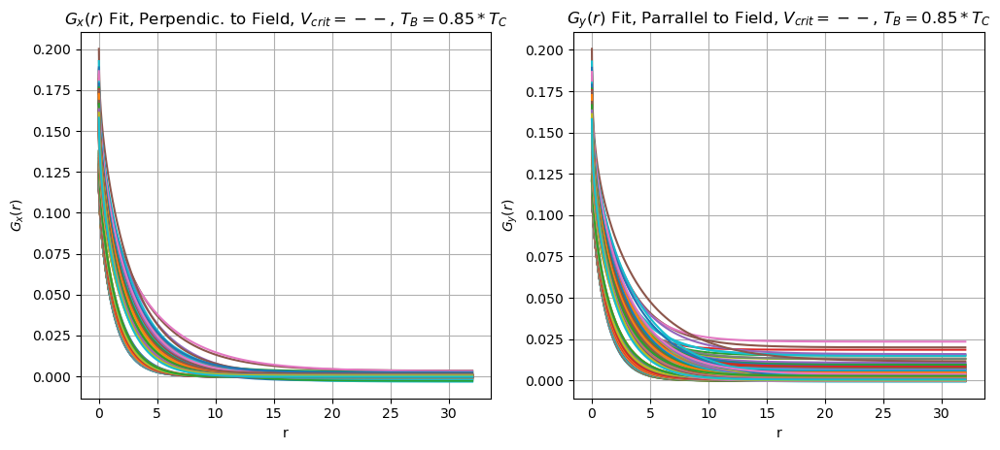

In [18]:
upper = 1000.
lower = 680.

f = plt.figure(figsize=(12, 5)); # plot the calculated values    
# plt.title("Average Correlation plots")

sp =  f.add_subplot(1, 2, 1 );
for k in range(0,nn):
#     if E_up[k]*my > lower and E_up[k]*my < upper :
        plt.plot(x_ax2,Gx_fit[k,:],label = "E = " + format(E_up[k]*(my)))
#         plt.scatter(x_ax,Gx_fit[k,:],label = "E = " + format(E_up[k]*(my), '.2f'), s = 4 )

plt.title(r'$G_x(r)$ Fit, Perpendic. to Field, $V_{crit} = --$, $T_B = 0.85*T_C$')

# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_x(r)$')
plt.xlabel('r')
   
# plt.show()    


sp =  f.add_subplot(1, 2, 2 );
for k in range(0,nn):
#     if E_up[k]*my > lower and E_up[k]*my < upper :   
        plt.plot(x_ax2,Gy_fit[k,:],label = "E = " + format(E_up[k]*(my)) )
#         plt.scatter(x_ax,Gy_fit[k,:],label = "E = " + format(E_up[k]*(my), '.2f'), s = 4 )

plt.title(r'$G_y(r)$ Fit, Parrallel to Field, $V_{crit} = --$, $T_B = 0.85*T_C$')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_y(r)$')
plt.xlabel('r')  
# plt.show()


# plt.savefig(path1 + "gofr_85%_2.pdf",bbox_inches='tight')

# for k in range(0,nn):
#     plt.plot(x_ax,Gy_fit[k,:],label = "E = " + format(E_up[k]*(my))
# #     plt.scatter(x_ax,Gy_fit[k,:],label = "E = " + format(E_up[k]*(my), '.2f'), s = 4 )

# plt.title(r'$G_y(r)$ Fit, Parrallel to Field, $V_{crit} = --$, $T_B = 0.85*T_C$')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
# plt.axhline(y = 0.22)
# plt.grid(b=True,which='major', axis='both')
# plt.ylabel('$G_y(r)$')
# plt.xlabel('r')  
# # plt.savefig(path1 + "gofry_90%_full.pdf",bbox_inches='tight')
# plt.show()    

In [19]:
hwhm_x = np.zeros(nn)
hwhm_y = np.zeros(nn)

print(np.shape(Gy_fit), np.shape(Gx_fit))

# print(Gy_fit)
for k in range(nn):
    half_max = np.max(Gx_fit[k,:])/2.
#     half_max = 0.1
    for r in range(datpts-1):
        if Gx_fit[k,r] > half_max and Gx_fit[k,r+1] <= half_max:
#             print(x_ax[r+1])
            hwhm_x[k] = x_ax2[r+1]

# for k in range(nn):
#     half_max = np.max(Gy_fit[k,:])/2.
#     if E_up[k]*my < V_crit or E_up[k]*my > V_metal: 
#         for r in range(datpts-1):    
#             if Gy_fit[k,r] > half_max and Gy_fit[k,r+1] <= half_max:
#                 hwhm_y[k] = x_ax1[r+1]
#     else:
# #         for r in range(datpts-1):
#         ff = np.where(Gy_fit[k,r] - Gy_fit[k,r+1] <= 0.0001, r, 32)
#         hwhm_y[k] = x_ax1[ff]

for k in range(nn):
    half_max = np.max(Gy_fit[k,:])/2.
    for r in range(datpts-1):    
        if Gy_fit[k,r] > half_max and Gy_fit[k,r+1] <= half_max:
            hwhm_y[k] = x_ax2[r+1]
#         elif Gy_fit[k,r] > 0.22  and Gy_fit[k,r+1] <= 0.22:
#             hwhm_y[k] = x_ax1[-1]
#         else:
#             None
#     print(E_up[k]*my, half_max > Gy_fit[k,-1])

            
        
    


(200, 16384) (200, 16384)


In [20]:
# plt.scatter(E_up*my,hwhm_x,label = r'$T_B = 0.85*T_C$')
# # plt.plot(E_up*my,hwhm_x)
# # plt.ylim(0,10)
# plt.xlabel("Total Voltage ($V_t$)")
# plt.ylabel(r'$r_{hw-hm}$')
# plt.title("Perpendicular to the Field")
# plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend()
# # plt.savefig(path1 + "HWHM_X.pdf",bbox_inches='tight')
# plt.show()

In [21]:
# plt.scatter(E_up*my,hwhm_y,label = r'$T_B = 0.85*T_C$')
# # plt.plot(E_up*my,hwhm_y)
# # plt.ylim(-1,10)
# plt.xlabel("Total Voltage ($V_t$)")
# plt.ylabel(r'$r_{hw-hm}$')
# plt.title("Parallel to the Field")
# plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend()
# # plt.savefig(path1 + "HWHM_Y.pdf",bbox_inches='tight')
# plt.show()

In [22]:
# plt.scatter(E_up*my,hwhm_y,label = r'Parallel to Field', color = "IndianRed")
# plt.scatter(E_up*my,hwhm_x,label = r'Perpen. to Field', color = "RoyalBlue")
# # plt.ylim(-1,10)
# plt.xlabel("Total Voltage ($V_t$)")
# plt.ylabel(r'$r_{hw-hm}$')
# plt.title(r'$T_B$ = $0.85T_C$')
# plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend()
# # plt.savefig(path1 + "HWHM.pdf",bbox_inches='tight')
# plt.show()

In [23]:
hwhm_x2 = np.zeros(nn)
hwhm_y2 = np.zeros(nn)

print(np.shape(Gy_fit), np.shape(Gx_fit))


# for k in range(nn):
#     half_max = np.max(Gx_fit[k,:])/2.
# #     half_max = 0.01
#     for r in range(maxdist-1):
#         if Gx_fit[k,r] > half_max and Gx_fit[k,r+1] <= half_max:
# #             print(x_ax[r+1])
#             hwhm_x[k] = x_ax[r+1]


for k in range(nn):
    for r in range(datpts-1):         
        dGy = Gx_fit[k,r] - Gx_fit[k,r+1]        
        if dGy <= 0.0001:         
#             print(E_up[k]*my, r, r+1, Gy_fit[k,r],Gy_fit[k,r+1] ,'diff :', dGy)
            hwhm_x2[k] = x_ax2[r+1]
            break    
    


for k in range(nn):
    for r in range(datpts-1):         
        dGy = Gy_fit[k,r] - Gy_fit[k,r+1]        
        if dGy <= 0.0001:         
#             print(E_up[k]*my, r, r+1, Gy_fit[k,r],Gy_fit[k,r+1] ,'diff :', dGy)
            hwhm_y2[k] = x_ax2[r+1]
            break

(200, 16384) (200, 16384)


In [24]:
# plt.scatter(E_up*my,hwhm_y2,label = r'$T_B = 0.85*T_C$')
# # plt.plot(E_up*my,hwhm_y)
# # plt.ylim(0,32)
# plt.xlabel("Total Voltage ($V_t$)")
# plt.ylabel(r'Domain sizes')
# plt.title("Parallel to the Field")
# plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend()
# # plt.savefig(path1 + "domain_Y.pdf",bbox_inches='tight')
# plt.show()

In [25]:
# plt.scatter(E_up*my,hwhm_x2,label = r'$T_B = 0.85*T_C$')
# # plt.plot(E_up*my,hwhm_x)
# # plt.ylim(0,10)
# plt.xlabel("Total Voltage ($V_t$)")
# plt.ylabel(r'$r_{hw-hm}$')
# plt.title("Perpendicular to the Field")
# plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend()
# # plt.savefig(path1 + "domain_X.pdf",bbox_inches='tight')
# plt.show()

In [26]:
# plt.scatter(E_up*my,hwhm_y2,label = r'Parallel to Field', color = "IndianRed")
# plt.scatter(E_up*my,hwhm_x,label = r'Perpen. to Field', color = "RoyalBlue")
# # plt.ylim(-1,10)
# plt.xlabel("Total Voltage ($V_t$)")
# plt.ylabel(r'$r_{hw-hm}$')
# plt.title(r'$T_B$ = $0.85T_C$')
# plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend()
# # plt.savefig(path1 + "Domain_Size.pdf",bbox_inches='tight')
# plt.show()

In [27]:
# plt.scatter(E_up*my,hwhm_y2,label = r'Parallel to Field', color = "IndianRed")
# plt.scatter(E_up*my,hwhm_x2,label = r'Perpen. to Field', color = "RoyalBlue")
# # plt.ylim(-1,10)
# plt.xlabel("Total Voltage ($V_t$)")
# plt.ylabel(r'$r_{hw-hm}$')
# plt.title(r'$T_B$ = $0.85T_C$')
# plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend()
# # plt.savefig(path1 + "Domain_Size2.pdf",bbox_inches='tight')
# plt.show()

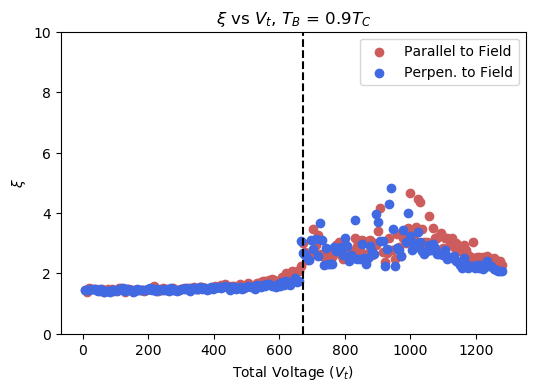

In [28]:
plt.scatter(E_up*my,xi_y,label = r'Parallel to Field', color = "IndianRed")
plt.scatter(E_up*my,xi_x,label = r'Perpen. to Field', color = "RoyalBlue")
plt.ylim(0,10)
plt.xlabel("Total Voltage ($V_t$)")
plt.ylabel(r'$\xi$')
plt.title(r'$\xi$ vs $V_t$, $T_B$ = $0.9T_C$')
plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
# plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend()
plt.savefig(path1 + "xi_2.pdf",bbox_inches='tight')
plt.show()

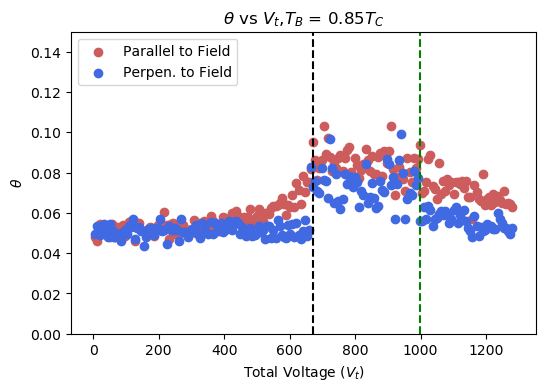

In [29]:
plt.scatter(E_up*my,thetay,label = r'Parallel to Field', color = "IndianRed")
plt.scatter(E_up*my,thetax,label = r'Perpen. to Field', color = "RoyalBlue")
plt.ylim(0,0.15)
plt.xlabel("Total Voltage ($V_t$)")
plt.ylabel(r'$\theta$')
plt.title(r'$\theta$ vs $V_t$,$T_B$ = $0.85T_C$')
plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend()
# plt.savefig(path1 + "theta.pdf",bbox_inches='tight')
plt.show()

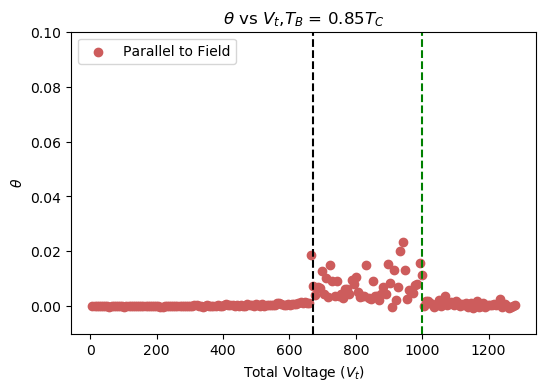

In [30]:
plt.scatter(E_up*my,yinf,label = r'Parallel to Field', color = "IndianRed")
# plt.scatter(E_up*my,thetax,label = r'Perpen. to Field', color = "RoyalBlue")
plt.ylim(-0.01,0.1)
plt.xlabel("Total Voltage ($V_t$)")
plt.ylabel(r'$\theta$')
plt.title(r'$\theta$ vs $V_t$,$T_B$ = $0.85T_C$')
plt.axvline(x=V_crit, linestyle = 'dashed' , color = 'black')
plt.axvline(x=V_metal, linestyle = 'dashed' , color = 'green')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend()
# plt.savefig(path1 + "theta.pdf",bbox_inches='tight')
plt.show()

## Alternate fit check

In [31]:
######### X 0 
p0 = [0.5,4.,0.5,0.5]
    
theta_xax = np.zeros((nn,Nsamp)) 
xi_xax = ((nn,Nsamp))

Gx_fit = np.zeros((nn,datpts))

for k in range(nn):
    p1, pc1 = curve_fit(fit_fn1, xax1, Gx[k,:], p0)
    per1 = np.sqrt(np.diag(pc1))
#     r = G_x[k,:] - fit_fn(x_ax,*p1)
#     chi2 = np.sum((r)**2)/(nn-2)
#     print(*p1)
    thetax.append(p1[0])
    xi_x.append(p1[1])
#     Gx_fit[k,:] = fit_fn1(x_ax2,*p1)
#     plt.scatter(x_ax,G_y[k,:], label = 'g(r) average', color = 'Blue', marker = 'x')
#     plt.plot(x_ax2,fit_fn1(x_ax2,*p1), label = "g(r) fit", color = 'IndianRed')
# #     plt.scatter(x_ax1, Gx[k,:], s=2, label = "g(r)")
#     plt.ylabel("g(r)")
#     plt.xlabel("r")
#     plt.title("$V_t$ = "+ format(E_up[k]*my,'.2f'))
#     plt.grid(b=True,which='major', axis='both')
#     plt.legend()
#     plt.show()

        




NameError: name 'xax1' is not defined

In [ ]:
########## Y -axis ##############
theta_xax = np.zeros((nn,Nsamp)) 
xi_xax = ((nn,Nsamp))

p0 = [0.5,4.,0.5,0.5]
Gy_fit = np.zeros((nn,datpts))
# Gy_fit = np.zeros((nn,maxdist))
for k in range(nn):
#     if E_up[k]*my < V_crit:
    p1, pc1 = curve_fit(fit_fn1, xax1, Gy[k,:], p0)
    per1 = np.sqrt(np.diag(pc1))
#     else : 
#         p1, pc1 = curve_fit(fit_fn, x_ax1, Gy[k,:], p0)
#         per1 = np.sqrt(np.diag(pc1))
        
#     r = G_x[k,:] - fit_fn(x_ax,*p1)
#     chi2 = np.sum((r)**2)/(nn-2)
#     print(*p1)
#     Gy_fit[k,:] = fit_fn1(x_ax2,*p1)
    thetay.append(p1[0])
    xi_y.append(p1[1])
#     plt.scatter(x_ax,G_y[k,:], label = 'g(r) average', color = 'Blue', marker = 'x')
#     plt.plot(x_ax2,fit_fn1(x_ax2,*p1), label = "g(r) fit", color = 'IndianRed')
# #     plt.scatter(x_ax1, Gy[k,:], s=2, label = "g(r)", color = 'black')
#     plt.ylabel("g(r)")
#     plt.xlabel("r")
#     plt.title("$V_t$ = "+ format(E_up[k]*my,'.2f'))
#     plt.grid(b=True,which='major', axis='both')
#     plt.legend()
#     plt.show()


